In [1]:
from torchvision import transforms, models 
import torch
from PIL import Image
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
from torch.autograd import Variable
from torch.nn import functional as F
from torch import topk #return max element in dim (can return K-max elements)
import numpy as np
import skimage.transform
from torchvision.models import resnet50, ResNet50_Weights
# import cv2 #open cv 
from math import sqrt

Microsoft Visual C++ Redistributable is not installed, this may lead to the DLL load failure.
                 It can be downloaded at https://aka.ms/vs/16/release/vc_redist.x64.exe


C:\anaconda\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: [WinError 127] Не найдена указанная процедура
  warn(f"Failed to load image Python extension: {e}")


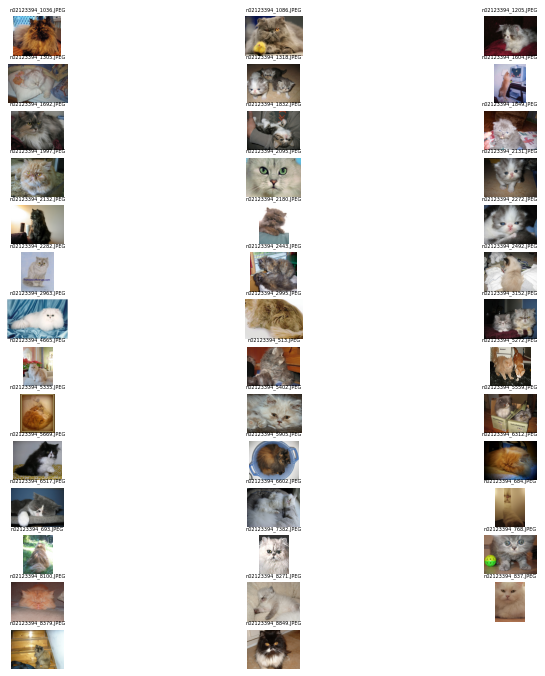

In [2]:
import os
import math

os.chdir("...") #return to root 
if os.path.isdir("catset"):
    os.chdir('catset')
    
list_of_pics = os.listdir() #list of pic's name
list_image = []
# Several pics mapping
def pics_mapping(listdir, row=2, col=3):
    row = math.ceil(len(listdir)/3)
    fig = plt.figure(figsize=(12, 12))
    for pcs in range(len(listdir)):
        fig.add_subplot(row, col, pcs+1)
        list_image.append(Image.open(str(listdir[pcs])))
        plt.imshow(Image.open(str(listdir[pcs])))
        plt.title(label=listdir[pcs], fontsize=5)
        plt.axis('off')
pics_mapping(list_of_pics)        

In [72]:
def preprocess_image(image):
    preprocess_callable = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]),
    transforms.Compose([transforms.Resize((224,224))])])
    
    return Variable((preprocess_callable(image).unsqueeze(0)), requires_grad=False)

                        
preproc_list = [preprocess_image(image) for image in list_image]
print(len(preproc_list), '\n', preproc_list[0].shape)


41 
 torch.Size([1, 3, 224, 224])


In [4]:
os.chdir("..") #return to root 

if os.path.isdir("interpreter"):
    os.chdir("interpreter") #return to root 
print(os.getcwd())
model = models.resnet50()
model.load_state_dict(torch.load('./resnet50-0676ba61.pth'))
model.eval()
print()


C:\Users\Уткин\nnet\interpreter



In [5]:
features = []
def hook(module, input, output): 
    # module: param_layer_four
    # input : input forward function  [#2]
    # output: is  [#3 param_layer_four(output)]
    features.append(output.clone().detach())
    # output is saved  in a list 

# preproc_list

param_layer_four = model._modules.get('layer4')

act_layer_four = param_layer_four.register_forward_hook(hook) ## Get the intermediate result of the entire Lenet model conv2
prediction_list = [model(pred) for pred in preproc_list]

print('act_len', len(features), '\nact_shape:', features[0].size())
act_layer_four.remove()

act_len 41 
act_shape: torch.Size([1, 2048, 7, 7])


In [6]:
#Do we need a hook for FC?
# prediction_list

idx = topk(prediction_list[0], 1)[1].int() #283
idx_list = [topk(pred, 1)[1].int() for pred in prediction_list]
print('idx:', idx, '\nidx_list:', len(idx_list))
list_for_set = [torch.squeeze(lt).tolist() for lt in idx_list]
idx_numpy_type = [torch.squeeze(lt).numpy() for lt in idx_list]
print('Number of class type:', set(list_for_set))


respectation = [{i:j} for i, j in zip(list_of_pics, idx_numpy_type)]
respectation

idx: tensor([[283]], dtype=torch.int32) 
idx_list: 41
Number of class type: {283, 700, 260, 782}


[{'n02123394_1036.JPEG': array(283)},
 {'n02123394_1086.JPEG': array(283)},
 {'n02123394_1205.JPEG': array(283)},
 {'n02123394_1305.JPEG': array(283)},
 {'n02123394_1318.JPEG': array(283)},
 {'n02123394_1604.JPEG': array(782)},
 {'n02123394_1692.JPEG': array(283)},
 {'n02123394_1832.JPEG': array(283)},
 {'n02123394_1849.JPEG': array(283)},
 {'n02123394_1997.JPEG': array(283)},
 {'n02123394_2095.JPEG': array(283)},
 {'n02123394_2131.JPEG': array(283)},
 {'n02123394_2132.JPEG': array(283)},
 {'n02123394_2180.JPEG': array(283)},
 {'n02123394_2272.JPEG': array(283)},
 {'n02123394_2282.JPEG': array(283)},
 {'n02123394_2443.JPEG': array(283)},
 {'n02123394_2492.JPEG': array(700)},
 {'n02123394_2963.JPEG': array(283)},
 {'n02123394_2995.JPEG': array(283)},
 {'n02123394_3152.JPEG': array(283)},
 {'n02123394_4665.JPEG': array(283)},
 {'n02123394_513.JPEG': array(283)},
 {'n02123394_5272.JPEG': array(283)},
 {'n02123394_5335.JPEG': array(283)},
 {'n02123394_5402.JPEG': array(283)},
 {'n02123394_

In [7]:
weight_softmax_params = list(model._modules.get('fc').parameters())
weight_softmax = np.squeeze(weight_softmax_params[0].cpu().data.numpy())
print('2048 -> 1000 classes:', weight_softmax.shape)

2048 -> 1000 classes: (1000, 2048)


In [8]:
# preproc_list
# prediction_list
# features
# idx_numpy_type
# weight_softmax
# list_image

def CAM(out_feature, sum_weight, idx):
    out_feature = out_feature.cpu().data.numpy()
    _, nc, h, w = out_feature.shape
    imp = sum_weight[idx].dot(out_feature.reshape((nc, h*w))).reshape(h, w)
    cam = imp - np.min(imp)
    cam = cam / np.max(cam)
    return cam
# map_pictures = CAM(features[0], weight_softmax, idx_numpy_type[0])
map_pictures = [CAM(feature, weight_softmax, index) for feature, index in zip(features, idx_numpy_type)]
print('size of map:', map_pictures[0].shape, '\nlen of map_pictures:', len(map_pictures))


size of map: (7, 7) 
len of map_pictures: 41


torch.Size([224, 224])


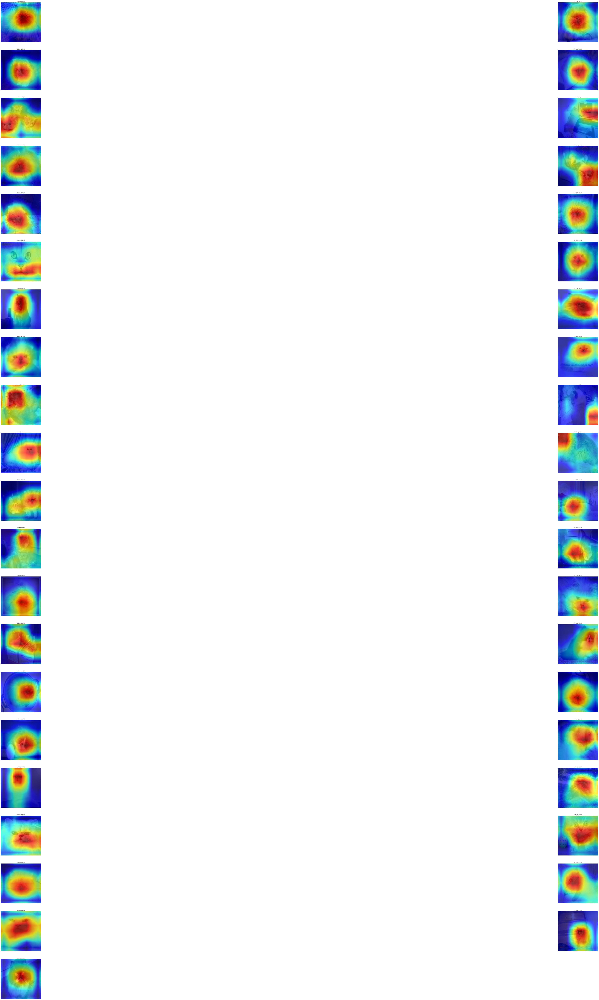

In [9]:
preprocess = transforms.Compose([
   transforms.Resize((224,224)),
   transforms.ToTensor(),
   transforms.Normalize(
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225])])


print(preproc_list[0].shape[2:4])

def image_act_on_pcs(listdir, map_pictures, row=2, col=2):
    row = math.ceil(len(listdir)/col)
    fig = plt.figure(figsize=(128, 128))
    display = transforms.Compose([transforms.Resize((224,224))])

    for pcs in range(len(listdir)):
        fig.add_subplot(row, col, pcs+1)
        plt.imshow(display(Image.open(str(listdir[pcs]))))
        plt.imshow(skimage.transform.resize(map_pictures[pcs], 
                                 preproc_list[0].shape[2:4]), 
                                 alpha=0.7, 
                                 cmap='jet')
        
        plt.title(label=listdir[pcs], fontsize=5)
        plt.axis('off')
        
os.chdir("...") #return to root 
if os.path.isdir("catset"):
    os.chdir('catset')
image_act_on_pcs(list_of_pics, map_pictures)

In [10]:
# preproc_list
# prediction_list
# features
# idx_numpy_type
# weight_softmax
# list_image

def vector_from_CAM(out_feature, sum_weight, idx):
    out_feature = out_feature.cpu().data.numpy()
    _, nc, h, w = out_feature.shape
    imp = sum_weight[idx].dot(out_feature.reshape((nc, h*w)))
    cam = imp - np.min(imp)
    cam = cam / np.max(cam)
    return cam
# map_pictures = CAM(features[0], weight_softmax, idx_numpy_type[0])
vectors = [vector_from_CAM(feature, weight_softmax, index) for feature, index in zip(features, idx_numpy_type)]
print('size of vectors:', vectors[0].shape, '\nlen of vectors:', len(vectors))
print(type(vectors[0]))

size of vectors: (49,) 
len of vectors: 41
<class 'numpy.ndarray'>


In [11]:
vectors_np = np.array(vectors).T #41 measurement; 49 features -> 49 x 41
print(vectors_np[0])

[0.07825606 0.05514532 0.03124331 0.01696894 0.02771962 0.
 0.12374242 0.05700568 0.03399746 0.04729294 0.00812053 0.03365859
 0.01504403 0.01606853 0.09021014 0.02184112 0.13001584 0.15766807
 0.00521681 0.9642236  0.02032821 0.05628546 0.03421203 0.26248774
 0.         0.06559101 0.03720538 0.03014544 0.058598   0.02412741
 0.00804664 0.         0.02078651 0.         0.10422256 0.17756048
 0.00560664 0.04357059 0.10962777 0.03719595 0.02902915]


In [12]:
mean_vec = [vectors_np[i] - vectors_np[i].mean() for i in range(vectors_np.shape[0])]
cov_matrix = np.cov(vectors_np)
print(type(cov_matrix[0][0]), cov_matrix.shape)

eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
idx = eigenvalues.argsort()[::-1]
eigenvalues_sorted = eigenvalues[idx]
eigenvectors = eigenvectors[:, idx]
# print('eigenvec: ', eigenvectors.real, 'eigenval: ', eigenvalues_sorted.real)

explained_var = np.cumsum(eigenvalues_sorted).real / np.sum(eigenvalues_sorted).real
# print('cumsum: ', np.cumsum(eigenvalues_sorted).real)
# print('sum: ', np.sum(eigenvalues_sorted).real)
# explained_var.real
n_comp = np.argmax(explained_var >= 0.95) + 1
print(n_comp)
n_comp = 25
print('handle number: ', n_comp)
u_095 = eigenvectors[:, :n_comp]

vectors_new = np.dot(u_095.T, vectors_np)
print('vector_new: ', vectors_new.shape)
print('u_095: ', u_095.shape)
u_095[0].shape

print(vectors_new.shape)
print(u_095.shape)
restored = np.array([(np.dot(vectors_new.T, u_095[i]) + vectors_np[i].mean()) \
                    for i in range(vectors_np.shape[0])])
restored_t = restored.T
print(restored_t.shape)

<class 'numpy.float64'> (49, 49)
11
handle number:  25
vector_new:  (25, 41)
u_095:  (49, 25)
(25, 41)
(49, 25)
(41, 49)


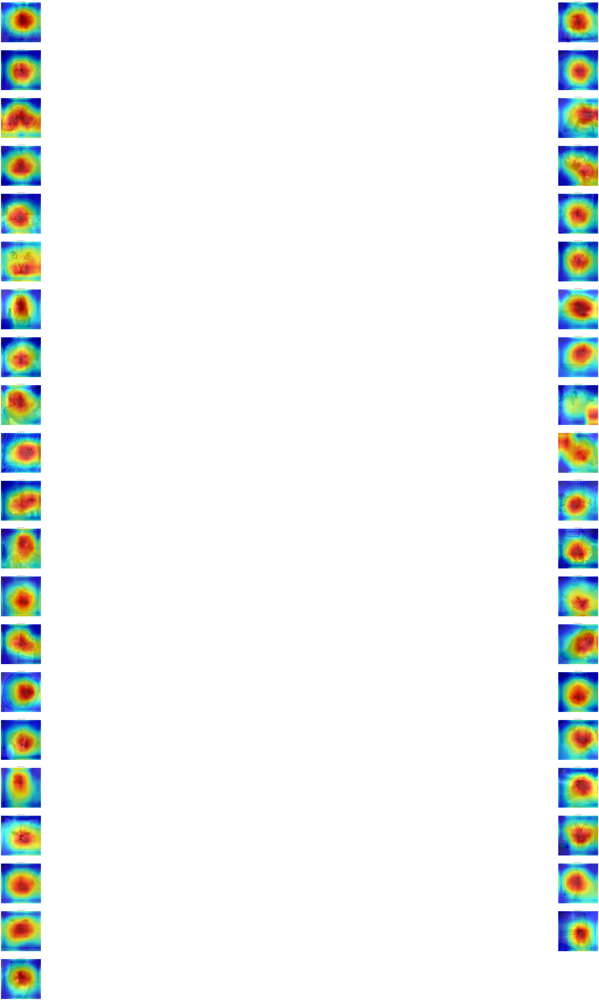

In [13]:
def restored_on_pcs(listdir, map_pictures, row=2, col=2):
    row = math.ceil(len(listdir)/col)
    fig = plt.figure(figsize=(128, 128))
    restored_reshape = np.array([restored_t[i].real.reshape(7,7)\
                   for i in range(restored_t.shape[0])])
    
    for pcs in range(len(listdir)):
        fig.add_subplot(row, col, pcs+1)
        plt.imshow(display(Image.open(str(listdir[pcs]))))
        plt.imshow(skimage.transform.resize(restored_reshape[pcs], 
                                 preproc_list[0].shape[2:4]), 
                                 alpha=0.7, 
                                 cmap='jet')
        
        plt.title(label=listdir[pcs], fontsize=5)
        plt.axis('off')
        
restored_on_pcs(list_of_pics, restored_t, row=2, col=2)

In [14]:
def vectors_new_on_pcs(listdir, vectors_new, row=2, col=2):
#     vectors_new = vectors_new.T
    vectors_reshape = np.array([vectors_new[i].real \
                .reshape(int(sqrt(n_comp)),int(sqrt(n_comp))) \
                   for i in range(vectors_new.shape[0])])
    
    row = math.ceil(len(listdir)/col)
    fig = plt.figure(figsize=(128, 128))
  
    for pcs in range(len(listdir)):
        fig.add_subplot(row, col, pcs+1)
        plt.imshow(display(Image.open(str(listdir[pcs]))))
        plt.imshow(skimage.transform.resize(vectors_reshape[pcs], 
                                 preproc_list[0].shape[2:4]), 
                                 alpha=0.7, 
                                 cmap='jet')
        
        plt.title(label=listdir[pcs], fontsize=10)
        plt.axis('off')
        
vectors_new_on_pcs(list_of_pics, vectors_new, row=2, col=2)

ValueError: cannot reshape array of size 41 into shape (5,5)

In [15]:
print(vectors_np.shape)
from sklearn.decomposition import PCA
pca = PCA(n_components=36)
reduced = pca.fit_transform(np.transpose(vectors_np))
n_comp = 36

(49, 41)


In [16]:
reduced.shape

(41, 36)

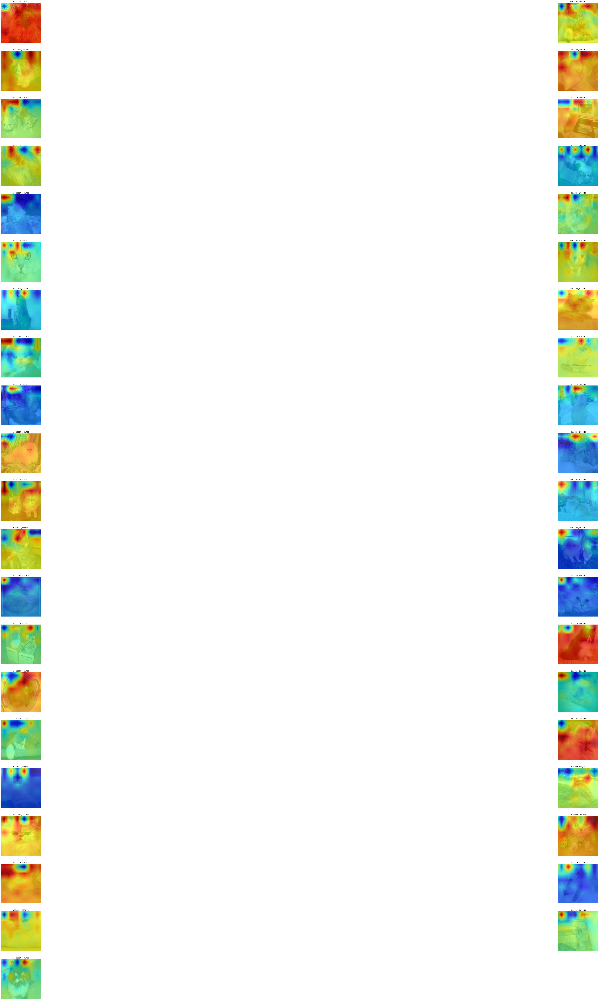

In [17]:
def vectors_PCA_on_pcs(listdir, vectors_new, row=2, col=2):
#     vectors_new = vectors_new.T
    vectors_reshape = np.array([vectors_new[i].real \
                .reshape(int(sqrt(n_comp)),int(sqrt(n_comp))) \
                   for i in range(vectors_new.shape[0])])
    
    row = math.ceil(len(listdir)/col)
    fig = plt.figure(figsize=(128, 128))
  
    for pcs in range(len(listdir)):
        fig.add_subplot(row, col, pcs+1)
        plt.imshow(display(Image.open(str(listdir[pcs]))))
        plt.imshow(skimage.transform.resize(vectors_reshape[pcs], 
                                 preproc_list[0].shape[2:4]), 
                                 alpha=0.7, 
                                 cmap='jet')
        
        plt.title(label=listdir[pcs], fontsize=10)
        plt.axis('off')
        
vectors_PCA_on_pcs(list_of_pics, reduced, row=2, col=2)

In [19]:
vectors_new.T.shape

(41, 25)

In [53]:
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.cm as cm
vector_kn = vectors_np

In [58]:
sse = []
for k in range(1, 6):
    km = KMeans(n_clusters = k, random_state=2)
    km.fit(vector_kn)
    sse.append(km.inertia_)

C:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than availabl

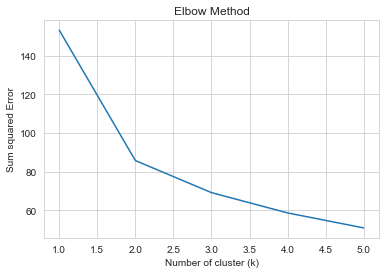

In [60]:
sns.set_style('whitegrid')
g=sns.lineplot(x=range(1,6), y=sse)
g.set(xlabel = 'Number of cluster (k)',
      ylabel = 'Sum squared Error',
      title = 'Elbow Method')
plt.show()

In [61]:
km.cluster_centers_.shape

(5, 41)

C:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:1334: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


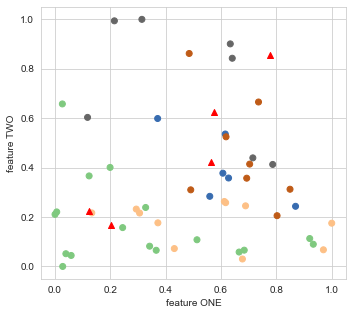

In [70]:
pred = km.fit_predict(vector_kn)
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.scatter(vector_kn[:, 4], vector_kn[:, 5], c = pred, cmap=cm.Accent)
plt.grid(True)
for center in km.cluster_centers_:
    center = center[:4]
    plt.scatter(center[0], center[1], marker='^', c='red')
    plt.xlabel('feature ONE')
    plt.ylabel('feature TWO')